In [1]:
## 20240308 NF/FF Flights with fixed pulsing cadence over WLC... (use WLC Site named for each polarization!)
## Group 1: ch0=Bicolog, ch1=Telescope_Y_NSpol
    ## 'FLY001Airdata.csv' - Altitude ~60m, Yaw ~0deg  --> FFNS
    ## 'FLY002Airdata.csv' - Altitude ~10m, Yaw ~0deg   --> NFNS
## Group 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY003Airdata.csv' - Altitude ~10m, Yaw ~90deg  --> NFEW
    ## 'FLY004Airdata.csv' - Altitude ~60m, Yaw ~90deg --> FFEW

##From loadD3Adata_Dallas.py:
from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
##From WT:
import datetime
import pytz
import os
import glob
from matplotlib import colors
import pandas
import csv
import pickle
%matplotlib inline
import beamcals
from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
from beamcals import beammap
from beamcals import reduce_ccclass
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
import beamcals.reduce_ccclass as rc
from beamcals.sites import site
wlcsiteEW=site.site('../beamcals_venv/newburghlabdrone/beamcals/beamcals/sites/WLC_config_EW20230519.npz')
wlcsiteNS=site.site('../beamcals_venv/newburghlabdrone/beamcals/beamcals/sites/WLC_config_NS20230519.npz')

#phase unwrap:
from skimage.restoration import unwrap_phase

# Display settings:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [5]:
#Define some nice functions for this notebook:

from scipy.interpolate import griddata

def unwrap2d(phi_arr,wrap_args=(False,False)):
    naninds=np.isnan(phi_arr)
    mask_arr=np.zeros_like(phi_arr,dtype=bool)
    mask_arr[naninds]=True    
    phi_mask=np.ma.array(phi_arr,mask=mask_arr)
    phi_mask[naninds]=0.0
    phi_unwrap=unwrap_phase(phi_mask,wrap_around=wrap_args)
    phi_out=phi_unwrap.data-np.nanmean(phi_unwrap.data)
    phi_out[naninds]=np.nan
    phi_arr[naninds]=np.nan
    return(phi_out)

from scipy.optimize import least_squares
from scipy.optimize import curve_fit

# Solve for ABC st (drnpos•[A,B,C])==np.angle(V01) for drnpos in cut boundaries where geometric 
# phase contribution is nonnegligible

def Fringe_Fit(P,dronepos,V):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F])/np.abs(dronepos+np.array([D,E,F])),[A,B,C]))+G
    return phase-V

def Fringe(P,dronepos):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F])/np.abs(dronepos+np.array([D,E,F])),[A,B,C]))+G
    return phase

def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

In [3]:
## All of the paths in this notebook will be broken since I was doing this on my machine
pckldir="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/pickles/"
gfitdir="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/gfits/"
pcklarr=np.sort(os.listdir(pckldir))
gfitarr=np.sort(os.listdir(gfitdir))
print(pcklarr[:])
print(gfitarr[:])

['FLY001Airdata_20240308T172037Z_ver_20240409T153507_concat.pkl'
 'FLY002Airdata_20240308T183549Z_ver_20240409T154916_concat.pkl'
 'FLY003Airdata_20240308T191730Z_ver_20240409T161221_concat.pkl'
 'FLY004Airdata_20240308T195926Z_ver_20240409T162601_concat.pkl']
['FLY001Airdata_20240308T172037Z_2dGauss_and_Airy_Params.npz'
 'FLY002Airdata_20240308T183549Z_2dGauss_and_Airy_Params.npz'
 'FLY003Airdata_20240308T191730Z_2dGauss_and_Airy_Params.npz'
 'FLY004Airdata_20240308T195926Z_2dGauss_and_Airy_Params.npz']


In [4]:
#WL and Nyquist:
print('wavelengths:',(3e10/667.1875e6),(3e10/800.0e6))
print('Nyquist:',(3e10/667.1875e6)/2,(3e10/800.0e6)/2)

wavelengths: 44.96487119437939 37.5
Nyquist: 22.482435597189696 18.75


start of concat loop is: 2024-04-09 18:02:44.064545


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:306: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:306: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/scipy/stats/_binned_statistic.py:594: RuntimeWarning: invalid value encountered in subtract
  delta = values[vv] - flatsum[binnumbers] / flatcount[binnumbers]


end of concat loop is: 2024-04-09 18:03:03.89387224,           


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:367: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:380: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.d0_edges_grid[:,:,i],self.d1_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())


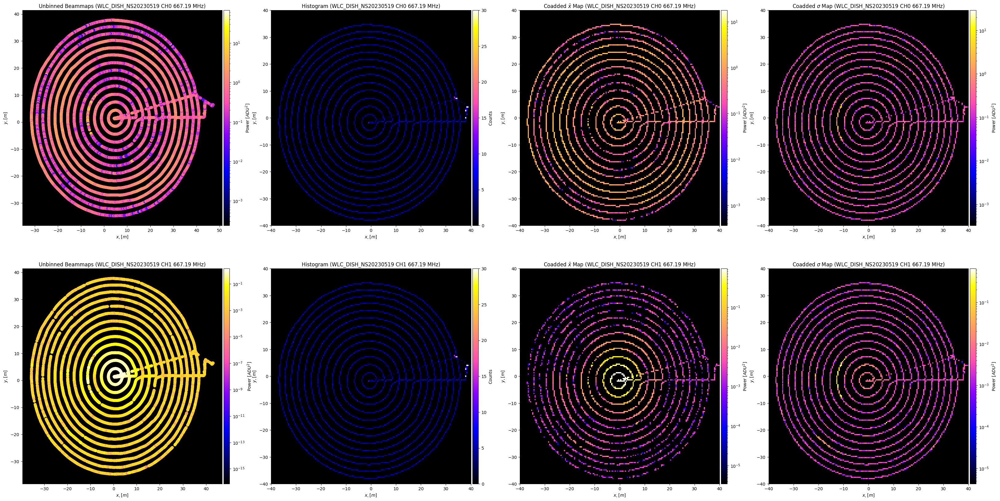

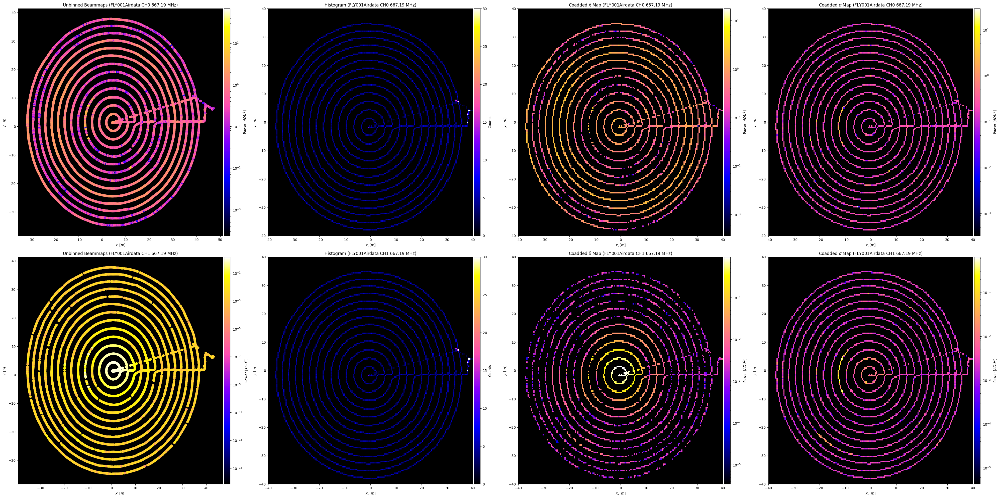

In [5]:
# Create the beammap class for FF Flight 1:

testbeam=beammap.Beammap(concatlist=[pcklarr[0]],gfitlist=[gfitarr[0]],\
                         ## These parameters might be interesting to explore: [xmin,xmax,dx],[ymin,ymax,dy], frequency plotted
                         d0args=[-40,40,0.45],d1args=[-40,40,0.45],f_index_cc=340,\
                         normalization='Gauss',operation='coadd',
                         pickle_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/pickles/",\
                         gfit_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/gfits/",\
                         flightmasterpath="/home/tyndall/python/beamcals_venv/newburghlabdrone/analysis/20240308_WLC_flights_forscripts.yaml",\
                         vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
# thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/beam_pickles/",include_cross_data=True)
# print(thingy.tmppath)
# with open(thingy.tmppath, 'wb') as outp:
#     pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
# print('DONE')

In [6]:
## Call the interpolation function from the beammap class

testbeam.complex_interpolation(d0_interp=testbeam.d0_centers[:,0], d1_interp=testbeam.d1_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

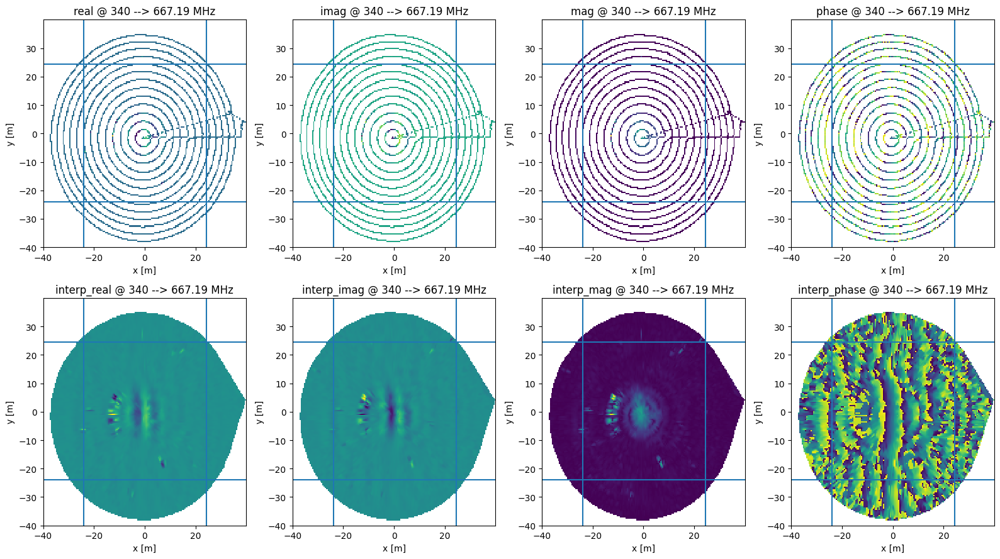

In [7]:
## plot the results of the interpolation and find where to cut to eliminate NAN values:

fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=340
ax1.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],np.abs(testbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],np.angle(testbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,testbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ## Plot the lines where we will do the reassignment/dimension change
    ax.axvline(testbeam.d0_centers_grid[35,0,0])
    ax.axhline(testbeam.d1_centers_grid[0,35,0])
    ax.axvline(testbeam.d0_centers_grid[-35,0,0])
    ax.axhline(testbeam.d1_centers_grid[0,-35,0])
    
tight_layout()

In [8]:
## This is where we reassign the arrays to a restricted range (inside the lines above)
## Careful not to run this twice, or things will start to break!

#stop
xmin,xmax,ymin,ymax=[35,-35,35,-35]
testbeam.beam_linear_interp=testbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_amp=testbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase=testbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase_unwrapped=testbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
testbeam.histogram_LC=testbeam.histogram_LC[xmin:xmax,ymin:ymax]
testbeam.V_LC_cross=testbeam.V_LC_cross[xmin:xmax,ymin:ymax]
testbeam.V_LC_mean=testbeam.V_LC_mean[xmin:xmax,ymin:ymax]
testbeam.V_LC_operation=testbeam.V_LC_operation[xmin:xmax,ymin:ymax]
testbeam.V_LC_std=testbeam.V_LC_std[xmin:xmax,ymin:ymax]
testbeam.d0_centers_grid=testbeam.d0_centers_grid[xmin:xmax,ymin:ymax]
testbeam.d0_edges_grid=testbeam.d0_edges_grid[xmin:xmax,ymin:ymax]
testbeam.d1_centers_grid=testbeam.d1_centers_grid[xmin:xmax,ymin:ymax]
testbeam.d1_edges_grid=testbeam.d1_edges_grid[xmin:xmax,ymin:ymax]
    
testbeam.d0_centers=testbeam.d0_centers[xmin:xmax]
testbeam.d0_edges=testbeam.d0_edges[xmin:xmax]
testbeam.d1_centers=testbeam.d1_centers[ymin:ymax]
testbeam.d1_edges=testbeam.d1_edges[ymin:ymax]

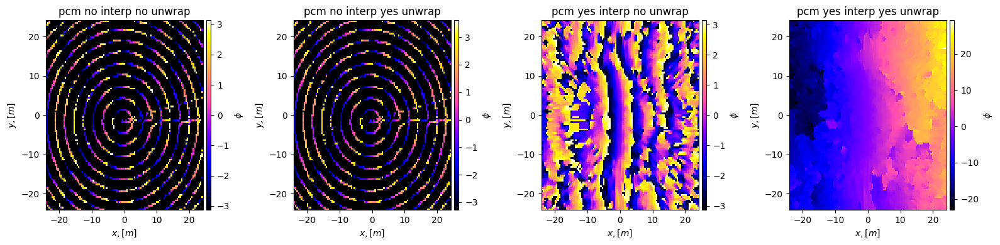

In [9]:
# Perform the phase unwrapping and plot the results, hopefully it appears as a gradient!
## pick a frequency by changing 'find', but be careful to change it in the other places it appears...

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=341
phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

im1=ax1.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi1unwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(5.649139,0.629309,-0.000153)
G=0.000


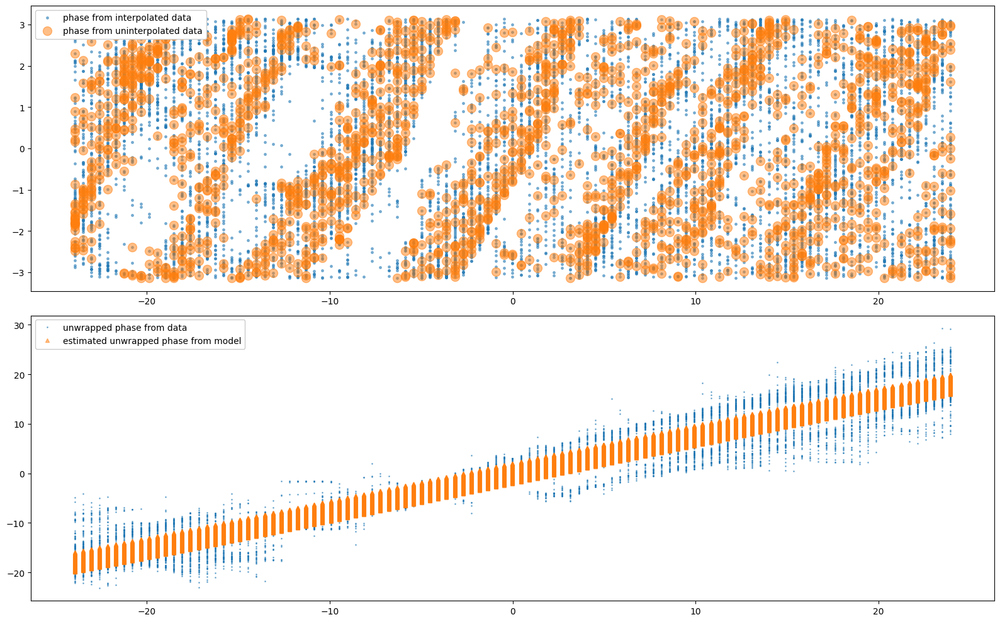

In [10]:
## Plot the wrapped and unwrapped phase, and see if a linear regression fits to the data... it should have a slope!

find=341
dx=testbeam.d0_centers_grid[:,:,0]
dy=testbeam.d1_centers_grid[:,:,0]
wl=(3.0e8/(testbeam.freq[find]*1e6))
dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()

phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(100*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))


def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
print("(A,B,C)=({:f},{:f},{:f})".format(popt[0],popt[1],popt[2]))
# print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[3]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoords[:,0],phi_i.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoords[:,0],phi1.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()


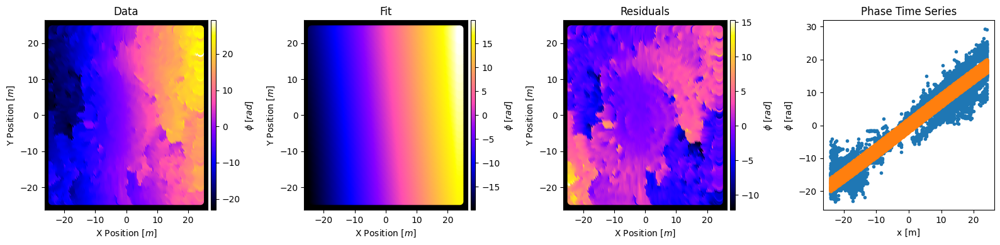

In [11]:
## Plot some stuff

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,unitvects,wl),cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,unitvects,wl)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [12]:
## Fitting loop for the fringing formula?

dx=testbeam.d0_centers_grid[:,:,0]
dy=testbeam.d1_centers_grid[:,:,0]
dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepopt=np.NaN*np.ones((140,4))
fringedata=np.NaN*np.ones((107,107,140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wl=(3.0e8/(testbeam.freq[find]/1e-6))
    dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
    if True in np.isnan(testbeam.beam_linear_interp_phase[:,:,find,0]):
        print('true, breaking loop to skip index {}'.format(k))
    else:
        phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))
        dcang=phi_iunwrap.flatten()
        fringedata[:,:,k]=phi_iunwrap
        popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
        fringepopt[k,:]=popt    

true, breaking loop to skip index 136
true, breaking loop to skip index 138
true, breaking loop to skip index 139


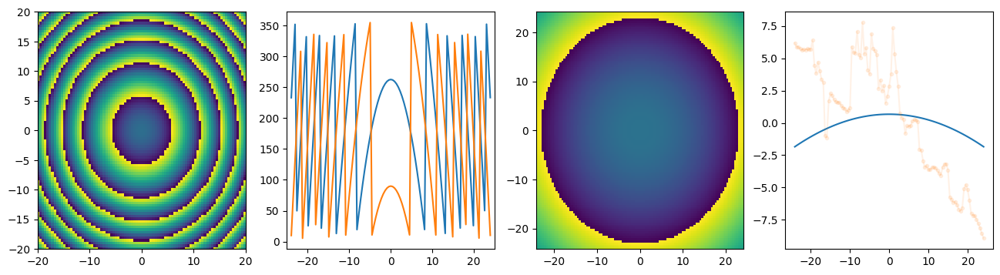

In [13]:
## ignore this, its a comparison to another groups methods, but should resemble residuals plot

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
ax1.pcolormesh(dx,dy,(-2*(180/np.pi)*(3e8/175e6)*np.sqrt((dx**2.0)+(dy**2.0)+(25.0**2.0)))%360)
ax1.set_xlim(-20,20)
ax1.set_ylim(-20,20)
ax2.plot(dx[:,70],(-2*(180/np.pi)*(3e8/175e6)*np.sqrt((dx[:,70]**2.0)+(dy[:,70]**2.0)+(25.0**2.0)))%360)
ax2.plot(dx[:,60],(-2*(180/np.pi)*(3e8/175e6)*np.sqrt((dx[:,60]**2.0)+(dy[:,60]**2.0)+(25.0**2.0)))%360)
ax2.set_xlim(-25,25)

ax3.pcolormesh(dx,dy,(-2*(3e8/680e6)*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi))
#ax3.set_xlim(-20,20)
#ax3.set_ylim(-20,20)
for k in [22]:
    ax4.plot(dx[:,100],((-2*(3e8/(testbeam.freq[k+250]*1e6))*np.sqrt((dx[:,100]**2.0)+(dy[:,70]**2.0)+(97.0**2.0)))%(2.0*np.pi))-np.pi)
    ax4.plot(dx[:,100],(fringedata[:,:,k]-Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape))[:,100],'.-',alpha=0.1)
    #ax4.plot(dx[:,100],np.angle(testbeam.V_LC_cross[:,100,k+250,0]),'x-',alpha=0.1)

/tmp/ipykernel_73648/1755884454.py:2: RuntimeWarning: Mean of empty slice
  semilogy(np.nanmean(np.nanmean(testbeam.V_LC_mean[:,:,:,0,0,],axis=0),axis=0))
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


(721.875, 643.75)

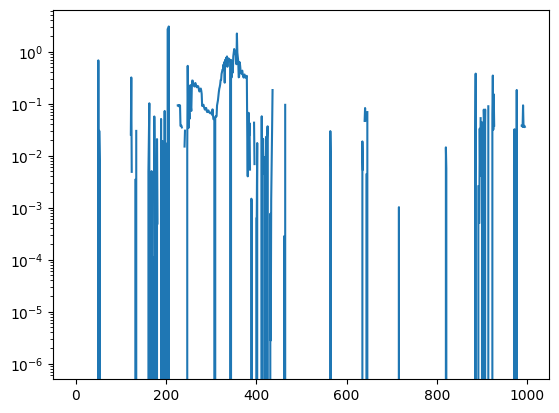

In [14]:
## ignore this too!
semilogy(np.nanmean(np.nanmean(testbeam.V_LC_mean[:,:,:,0,0,],axis=0),axis=0))
testbeam.freq[200],testbeam.freq[400]



MovieWriter ffmpeg unavailable; using Pillow instead.


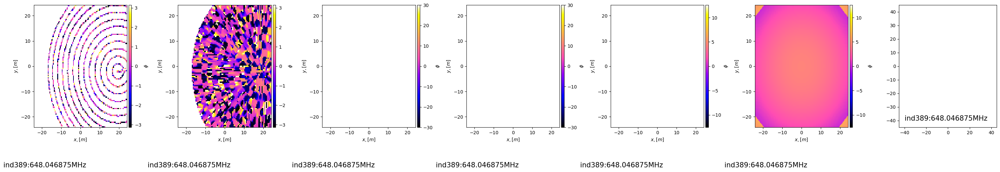

In [15]:
## Make the gif:
## can skip if annoying!

from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6,ax7]=subplots(nrows=1,ncols=7,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(testbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, testbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')
cax6 = ax6.pcolormesh(dx, dy, (-2*(3e8/(testbeam.freq[250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5,cax6]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
txt1=ax1.text(-40,-40, "", fontsize=15)
txt2=ax2.text(-40,-40, "", fontsize=15)
txt3=ax3.text(-40,-40, "", fontsize=15)
txt4=ax4.text(-40,-40, "", fontsize=15)
txt5=ax5.text(-40,-40, "", fontsize=15)
txt6=ax6.text(-40,-40, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax6.set_array((-2*(3e8/(testbeam.freq[vvv+250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi))
    
    ax7.clear()
    ax7.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax7.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),unitvects,(3.0e8/(testbeam.freq[vvv+250]/1e-6))).flatten(),'.')
    ax7.set_xlim(-45,45)
    ax7.set_ylim(-45,45)
    txt7=ax7.text(-40,-40, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt7.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=300, frames=140)
anim.save('../../Desktop/FFphase0308.gif')
show()

/tmp/ipykernel_73648/3406134481.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
/tmp/ipykernel_73648/3406134481.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


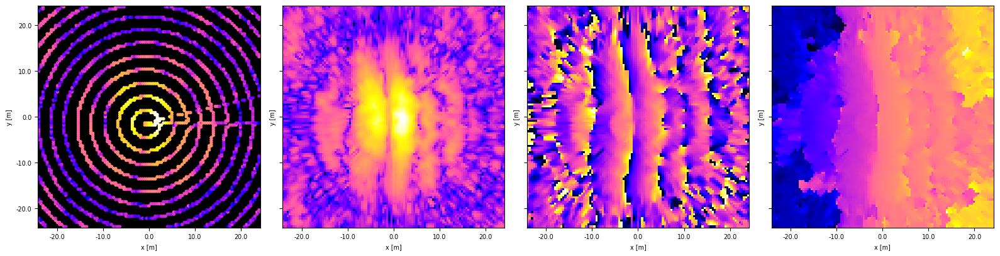

In [16]:
## This was where i was making plots for a presentation, nothing vital here!
testbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=270
ax1.scatter(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],c=np.abs(testbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
ax2.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],(testbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
ax3.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
ax4.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],fringedata[:,:,find-250],cmap='gnuplot2')

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')


tight_layout()


In [17]:
# NEARFIELD FLIGHT 1: 
#   NS Polarization
#   18m Altitude


In [18]:
## To prepare data for the NF2FF code, we need to determine the electric field in both polarizations:
## NF File 1: ch0=Bicolog, ch1=Telescope_Y_NSpol --> ## 'FLY781.csv' - Altitude ~18m, Yaw ~0deg --> NFNS18
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY782.csv' - Altitude ~18m, Yaw ~90deg  --> NFEW18
    ## 'FLY783.csv' - Altitude ~20m, Yaw ~90deg  --> NFEW20   
    
print(pcklarr)


['FLY001Airdata_20240308T172037Z_ver_20240409T153507_concat.pkl'
 'FLY002Airdata_20240308T183549Z_ver_20240409T154916_concat.pkl'
 'FLY003Airdata_20240308T191730Z_ver_20240409T161221_concat.pkl'
 'FLY004Airdata_20240308T195926Z_ver_20240409T162601_concat.pkl']


start of concat loop is: 2024-04-09 18:15:06.431295
end of concat loop is: 2024-04-09 18:15:22.16864024,           


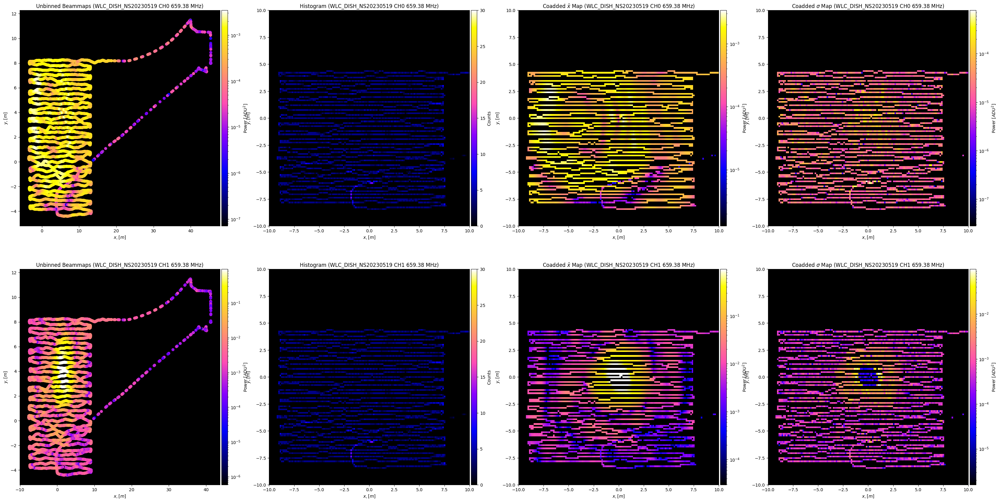

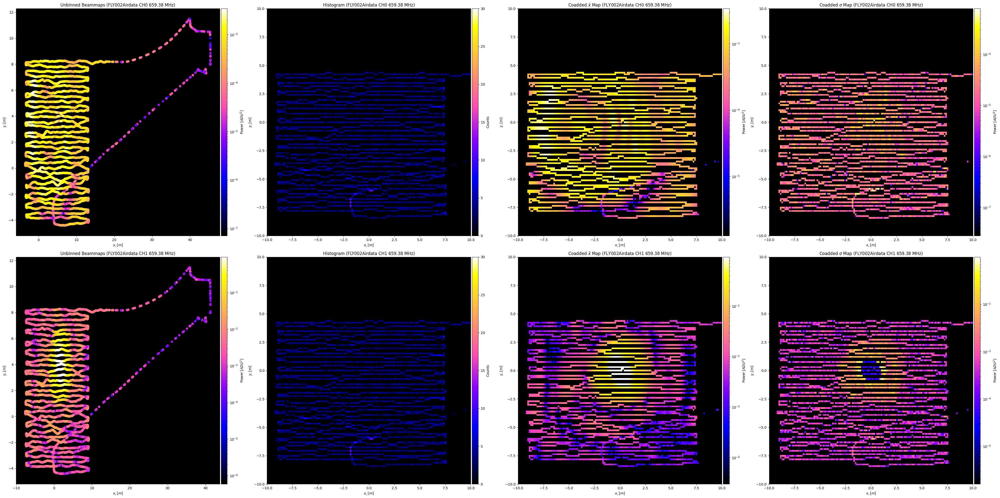

In [12]:
# Create the beammap class for NF Flight 1:

testbeam=beammap.Beammap(concatlist=[pcklarr[1]],gfitlist=[gfitarr[1]],\
                         d0args=[-10,10,0.15],d1args=[-10,10,0.15],f_index_cc=360,\
                         normalization='Gauss',operation='coadd',
                         pickle_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/pickles/",\
                         gfit_directory="/home/tyndall/Desktop/20240308_WLC_NFandFF/products/gfits/",\
                         flightmasterpath="/home/tyndall/python/beamcals_venv/newburghlabdrone/analysis/20240308_WLC_flights_forscripts.yaml",\
                         vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
# thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
# print(thingy.tmppath)
# with open(thingy.tmppath, 'wb') as outp:
#     pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
# print('DONE')

In [13]:
testbeam.complex_interpolation(d0_interp=testbeam.d0_centers[:,0], d1_interp=testbeam.d1_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

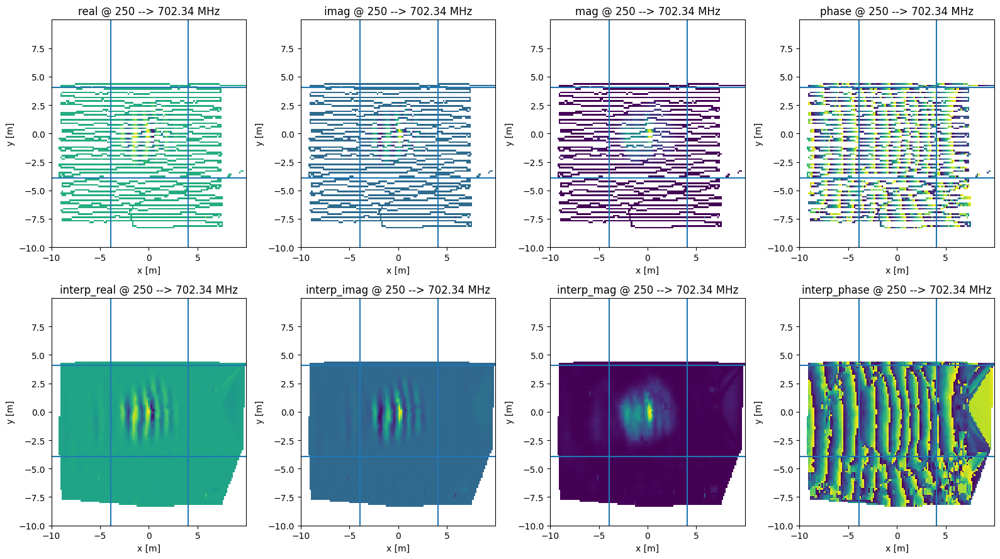

In [14]:
fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=250
ax1.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],np.abs(testbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],np.angle(testbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,testbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ax.axvline(testbeam.d0_centers_grid[40,0,0])
    ax.axhline(testbeam.d1_centers_grid[0,40,0])
    ax.axvline(testbeam.d0_centers_grid[-40,0,0])
    ax.axhline(testbeam.d1_centers_grid[0,-40,0])
tight_layout()

In [15]:
testbeam.beam_linear_interp_amp.shape

(133, 133, 1024, 1)

In [16]:
#stop
xmin,xmax,ymin,ymax=[40,-40,40,-40]
testbeam.beam_linear_interp=testbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_amp=testbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase=testbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase_unwrapped=testbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
testbeam.histogram_LC=testbeam.histogram_LC[xmin:xmax,ymin:ymax]
testbeam.V_LC_cross=testbeam.V_LC_cross[xmin:xmax,ymin:ymax]
testbeam.V_LC_mean=testbeam.V_LC_mean[xmin:xmax,ymin:ymax]
testbeam.V_LC_operation=testbeam.V_LC_operation[xmin:xmax,ymin:ymax]
testbeam.V_LC_std=testbeam.V_LC_std[xmin:xmax,ymin:ymax]
testbeam.d0_centers_grid=testbeam.d0_centers_grid[xmin:xmax,ymin:ymax]
testbeam.d0_edges_grid=testbeam.d0_edges_grid[xmin:xmax,ymin:ymax]
testbeam.d1_centers_grid=testbeam.d1_centers_grid[xmin:xmax,ymin:ymax]
testbeam.d1_edges_grid=testbeam.d1_edges_grid[xmin:xmax,ymin:ymax]
    
    
testbeam.d0_centers=testbeam.d0_centers[xmin:xmax]
testbeam.d0_edges=testbeam.d0_edges[xmin:xmax]
testbeam.d1_centers=testbeam.d1_centers[ymin:ymax]
testbeam.d1_edges=testbeam.d1_edges[ymin:ymax]

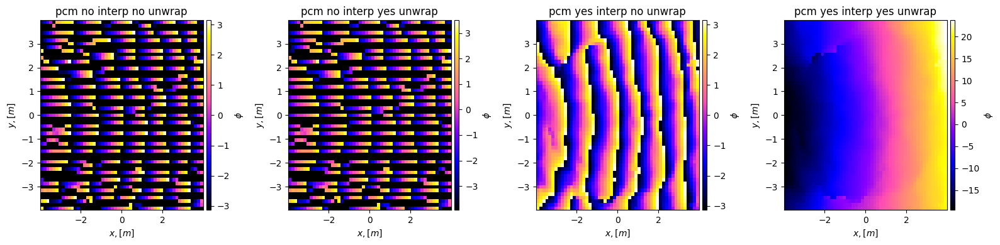

In [17]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=350
phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phiunwrap=unwrap2d(phi1,wrap_args=(False,True))
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))

im1=ax1.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(36.299970,2.457438,0.000037)
G=0.000


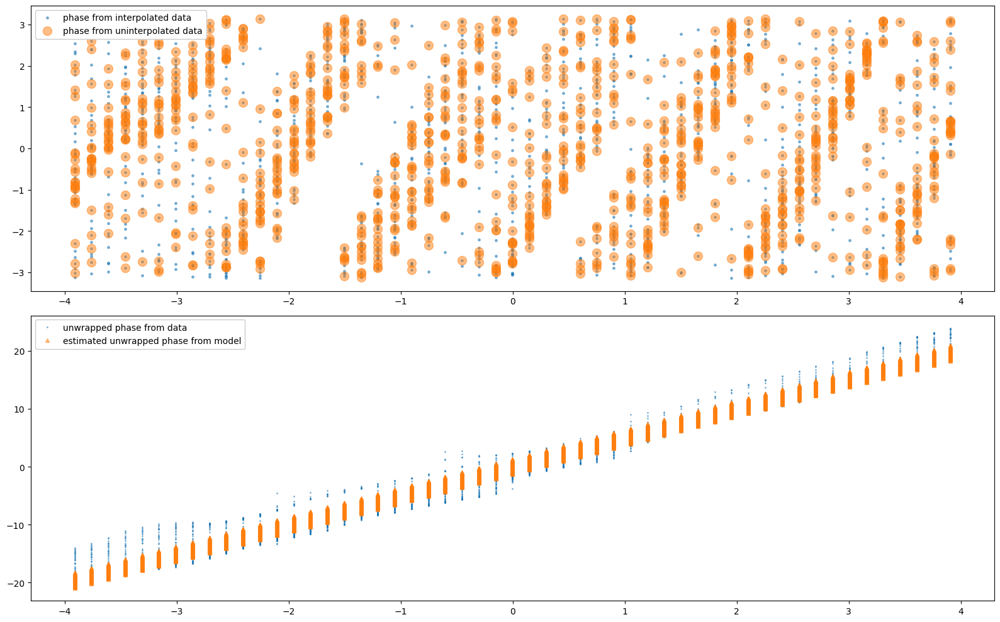

In [18]:
find=360
dx=testbeam.d0_centers_grid[:,:,0]
dy=testbeam.d1_centers_grid[:,:,0]
wl=(3.0e8/(testbeam.freq[find]*1e6))
dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()

phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phi1unwrap=unwrap2d(phi1)
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(100*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))


def Fringe_Fit(P,dronepos,V,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi-V

def Fringe(P,dronepos,wavelengthm):
    A,B,C,G=P
    phi=(2.0*np.pi/wavelengthm)*((A*(dronepos[:,0]))+(B*(dronepos[:,1]))+(C*(dronepos[:,2])))
    return phi

popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
print("(A,B,C)=({:f},{:f},{:f})".format(popt[0],popt[1],popt[2]))
# print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[3]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoords[:,0],phi_i.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoords[:,0],phi1.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()


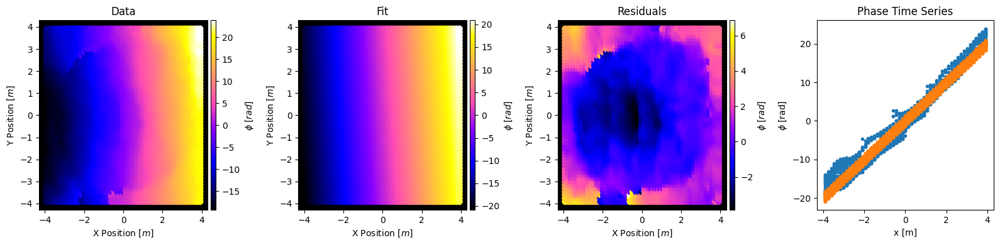

In [19]:
## Plot some stuff

fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,unitvects,wl),cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,unitvects,wl)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),unitvects,wl),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [21]:
## Fitting loop for the fringing formula?

#stop

dx=testbeam.d0_centers_grid[:,:,0]
dy=testbeam.d1_centers_grid[:,:,0]
dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()
unitvects=dcoords*np.outer(np.nansum((dcoords)**2.0,axis=1)**-0.5,np.ones(3))

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepopt=np.NaN*np.ones((140,4))
fringedata=np.NaN*np.ones((53,53,140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wl=(3.0e8/(testbeam.freq[find]/1e-6))
    dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
    if True in np.isnan(testbeam.beam_linear_interp_phase[:,:,find,0]):
        print('true, breaking loop to skip index {}'.format(k))
    else:
        phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))
        dcang=phi_iunwrap.flatten()
        fringedata[:,:,k]=phi_iunwrap
        popt=least_squares(Fringe_Fit,x0=np.array([0.0,0.0,0.0,0.0]),args=[unitvects[~np.isnan(dcang)],dcang[~np.isnan(dcang)],wl]).x
        fringepopt[k,:]=popt    

true, breaking loop to skip index 58
true, breaking loop to skip index 72
true, breaking loop to skip index 74
true, breaking loop to skip index 75


MovieWriter ffmpeg unavailable; using Pillow instead.


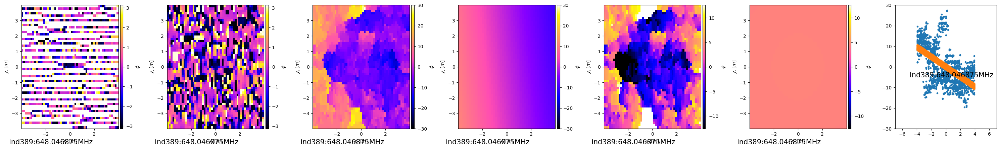

In [22]:
## Make the gif:
## can skip if annoying!

from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6,ax7]=subplots(nrows=1,ncols=7,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(testbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, testbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],unitvects,wl).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')
cax6 = ax6.pcolormesh(dx, dy, (-2*(3e8/(testbeam.freq[250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5,cax6]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
txt1=ax1.text(-5,-5, "", fontsize=15)
txt2=ax2.text(-5,-5, "", fontsize=15)
txt3=ax3.text(-5,-5, "", fontsize=15)
txt4=ax4.text(-5,-5, "", fontsize=15)
txt5=ax5.text(-5,-5, "", fontsize=15)
txt6=ax6.text(-5,-5, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],unitvects,wl).reshape(dx.shape))
    cax6.set_array((-2*(3e8/(testbeam.freq[vvv+250]*1e6))*np.sqrt((dx**2.0)+(dy**2.0)+(97.0**2.0)))%(2.0*np.pi))
    
    ax7.clear()
    ax7.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax7.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),unitvects,(3.0e8/(testbeam.freq[vvv+250]/1e-6))).flatten(),'.')
    ax7.set_xlim(-7,7)
    ax7.set_ylim(-30,30)
    txt7=ax7.text(-5,-5, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt7.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=300, frames=140)
anim.save('../../Desktop/NFphase0308.gif')
show()

/tmp/ipykernel_73896/4191075806.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
/tmp/ipykernel_73896/4191075806.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


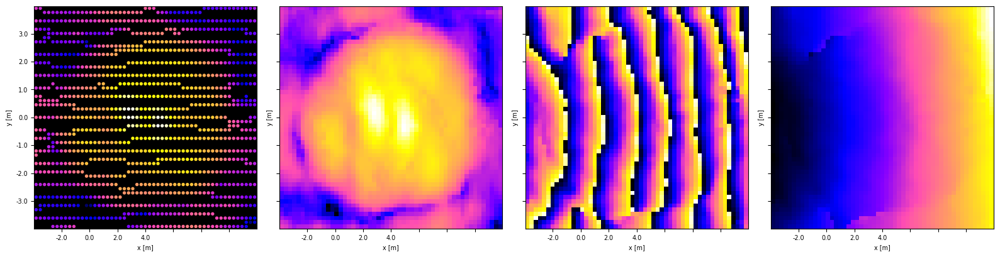

In [24]:
testbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=354
ax1.scatter(testbeam.d0_centers_grid[:,:,0],testbeam.d1_centers_grid[:,:,0],c=np.abs(testbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
ax2.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],(testbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
ax3.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
ax4.pcolormesh(testbeam.d0_edges_grid[:,:,0],testbeam.d1_edges_grid[:,:,0],fringedata[:,:,find-250],cmap='gnuplot2')

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')


tight_layout()


In [ ]:
## THIS IS WHERE WE STOPPED MAKING SURE STUFF WORKED :-)

0.4271412680756396

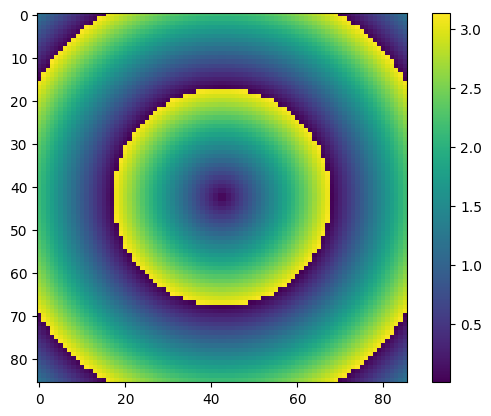

In [312]:
imshow((np.sqrt(dx**2.0+dy**2.0)/(2*np.pi*.427))%(np.pi))
colorbar()

3e8/(testbeam.freq[250]*1e6)

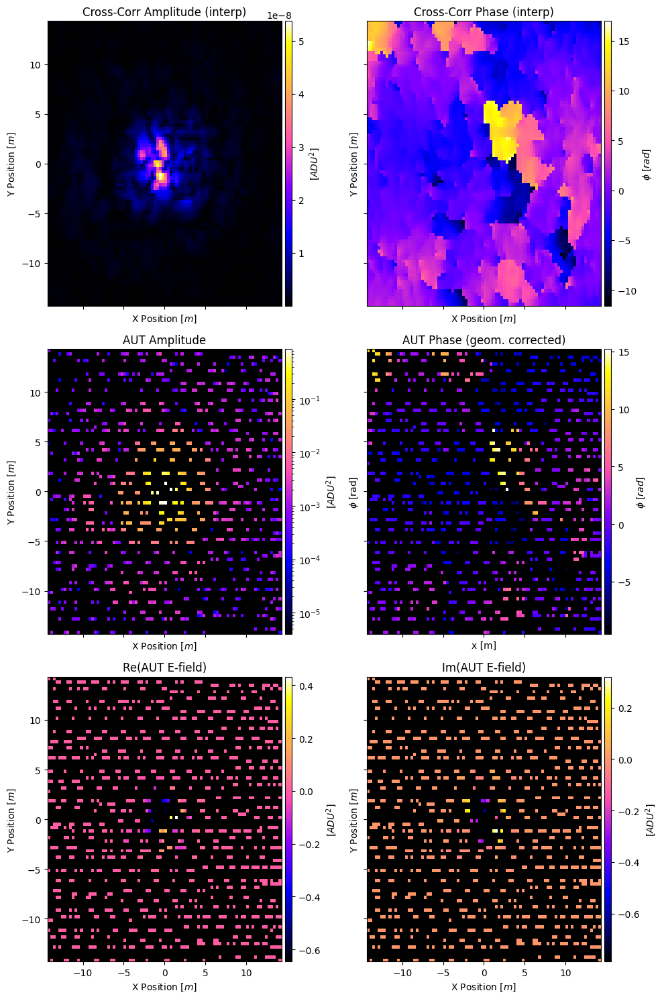

In [310]:
##  NF2FF Instructions
##  1. Preparation and Preliminary Measurements
##  2. Design a Flightpath optimized for NF Sampling 
##  3. Execute testflights and collect data
##  4. Analyze data using the Drone, Corr, and Concat Classes
##  5. Produce yaml, gfit, and pickle files of reduced data
##  6. Initialize the beammap class for each flight using the 0x1 (cross) data
##  7. Interpolate beammap data so that every cell contains data
##  8. Trim the interpolated beammap so that no nans are present
##  9. Execute the unwrap function on the interpolated data to unwrap the phase
## 10. Perform fit on the wrapped/unwrapped phase measurements
## 11. Subtract best-fit geometric phase from the unwrapped phase to obtain residual AUT phase
## 12. Reconstruct E-Field from AUT by complexifying the sqrt(auto=0x0) with the residual AUT phase

fig,[[ax1,ax2],[ax3,ax4],[ax5,ax6]]=subplots(nrows=3,ncols=2,figsize=(10,15),sharex=True,sharey=True)
zez=104
ampl=testbeam.V_LC_mean[:,:,250+zez,1,0]
nanmask=ampl/ampl
phase=fringedata[:,:,zez]-Fringe(fringepopt[zez],dcoords).reshape(dx.shape)
phasefactor=np.e**(1.0j*phase)
cplxEfieldNS=ampl*phasefactor

im1=ax1.pcolormesh(dx, dy, testbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
im2=ax2.pcolormesh(dx, dy, phase, cmap='gnuplot2')
im3=ax3.pcolormesh(dx, dy, ampl, norm=LogNorm(), cmap='gnuplot2')
im4=ax4.pcolormesh(dx, dy, nanmask*phase, cmap='gnuplot2')
im5=ax5.pcolormesh(dx, dy, np.real(cplxEfieldNS), cmap='gnuplot2')
im6=ax6.pcolormesh(dx, dy, np.imag(cplxEfieldNS), cmap='gnuplot2')

images=[im1,im2,im3,im4,im5,im6]
cbars=['[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','[$ADU^2$]']
titles=["Cross-Corr Amplitude (interp)","Cross-Corr Phase (interp)","AUT Amplitude","AUT Phase (geom. corrected)","Re(AUT E-field)","Im(AUT E-field)"]
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()

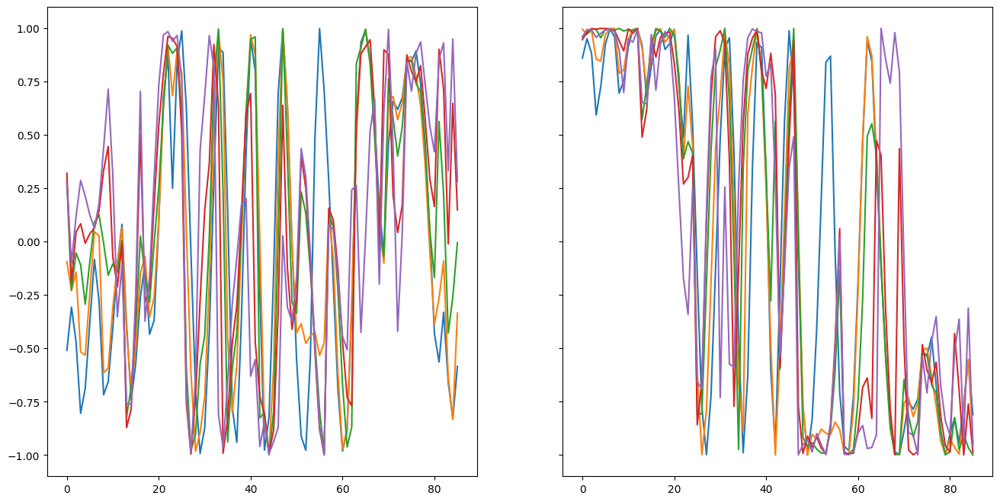

In [311]:
fig,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(16,8),sharex=True,sharey=True)

ax1.plot([np.real((phasefactor[k,:5])) for k in range(86)])
ax2.plot([np.imag((phasefactor[k,:5])) for k in range(86)])

In [210]:
## To prepare data for the NF2FF code, we need to determine the electric field in both polarizations:
## NF File 1: ch0=Bicolog, ch1=Telescope_Y_NSpol --> ## 'FLY781.csv' - Altitude ~18m, Yaw ~0deg --> NFNS18
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
    ## 'FLY782.csv' - Altitude ~18m, Yaw ~90deg  --> NFEW18
    ## 'FLY783.csv' - Altitude ~20m, Yaw ~90deg  --> NFEW20 

start of big ass loop is: 2024-02-05 15:21:29.088085


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/scipy/stats/_binned_statistic.py:594: RuntimeWarning: invalid value encountered in subtract
  delta = values[vv] - flatsum[binnumbers] / flatcount[binnumbers]


end of chan/freq loop is: 2024-02-05 15:21:46.648448           


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:329: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:342: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())


/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/FLY782_20230519T195003Z_ver_20240205T152147beam_concat.pkl
DONE


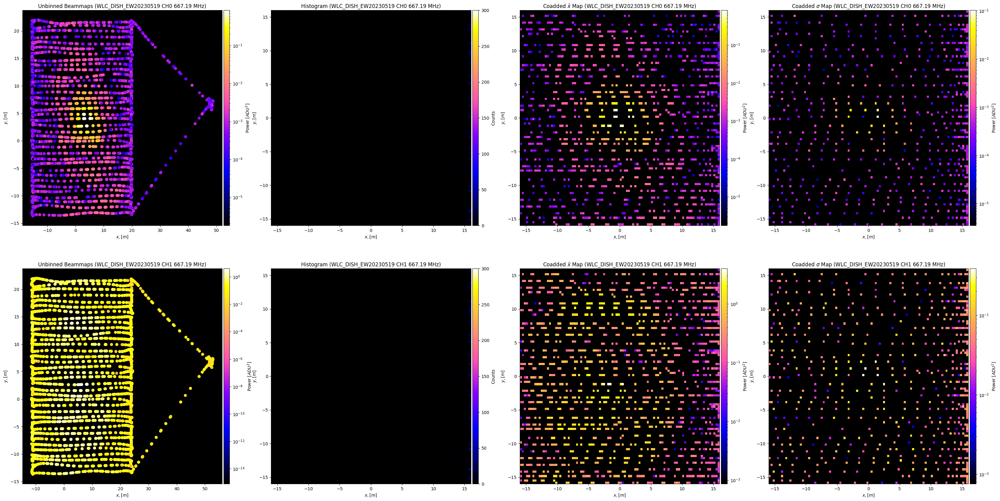

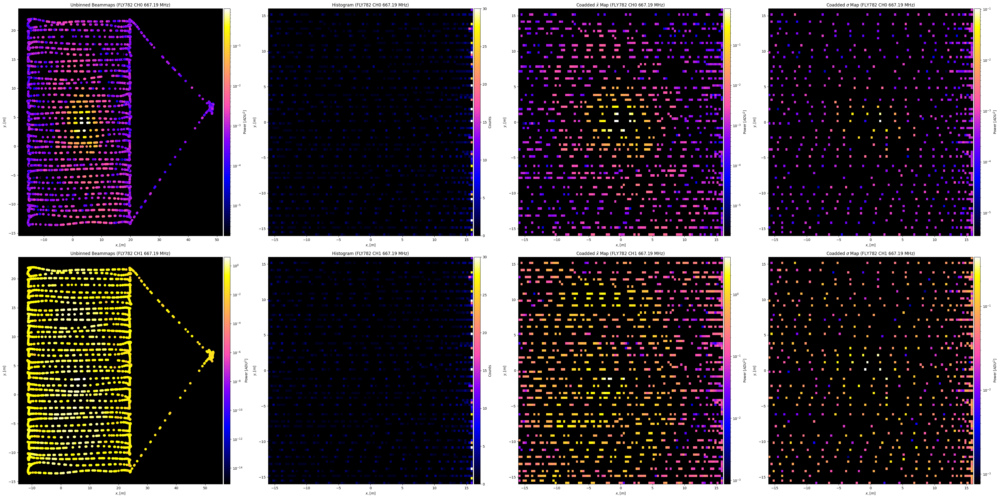

In [285]:
## NF File 2: ch0=Telescope_X_EWpol, ch1=Bicolog
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-18,16,0.45],Yargs=[-17,18,0.45],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-20,20,0.225],Yargs=[-20,20,0.225],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-16,16,0.45],Yargs=[-16,16,0.45],f_index=340,normalization='Gauss',operation='coadd',
testbeam=beammap.Beammap(concatlist=[pcklarr[3]],gfitlist=[gfitarr[3]],Xargs=[-16,16,0.33],Yargs=[-16,16,0.33],f_index=340,normalization='Gauss',operation='coadd',
                         pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/pickles/",\
                         gfit_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/gfits/",\
                         flightmasterpath="/home/tyndall/python/beamcals_venv/newburghlabdrone/analysis/WLC_flights_forscripts.yaml",vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
print(thingy.tmppath)
with open(thingy.tmppath, 'wb') as outp:
    pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
print('DONE')

In [286]:
testbeam.complex_interpolation(x_interp=testbeam.x_centers[:,0], y_interp=testbeam.y_centers[:,0],method='cubic',variogram_model='spherical',outputs=False,Fargs=[340,340])

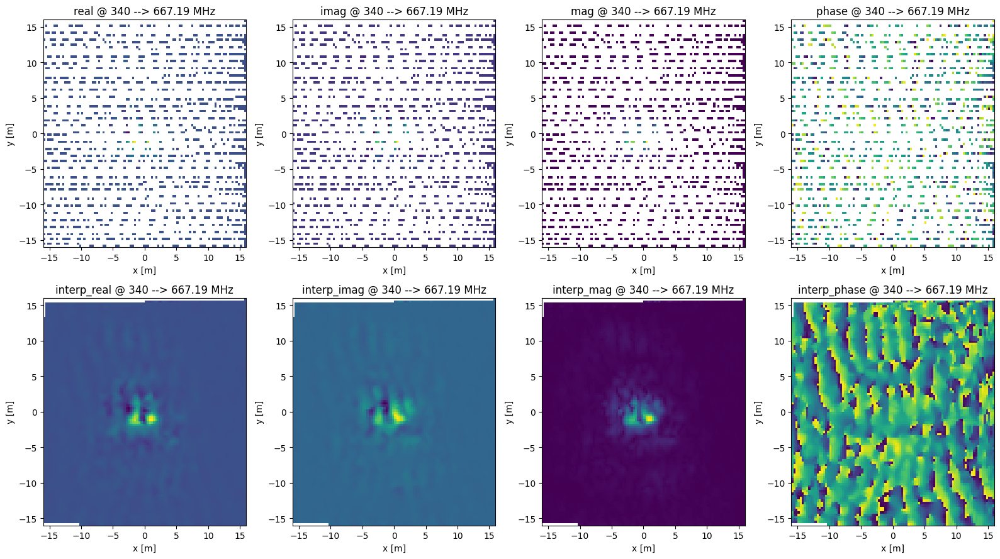

In [287]:
fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=340
ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.abs(testbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.angle(testbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,testbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
tight_layout()

In [288]:
testbeam.beam_linear_interp_amp.shape

(96, 96, 1024, 1)

In [289]:
#stop
xmin,xmax,ymin,ymax=[5,-5,5,-5]
testbeam.beam_linear_interp=testbeam.beam_linear_interp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_amp=testbeam.beam_linear_interp_amp[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase=testbeam.beam_linear_interp_phase[xmin:xmax,ymin:ymax]
testbeam.beam_linear_interp_phase_unwrapped=testbeam.beam_linear_interp_phase_unwrapped[xmin:xmax,ymin:ymax]
testbeam.histogram_LC=testbeam.histogram_LC[xmin:xmax,ymin:ymax]
testbeam.V_LC_cross=testbeam.V_LC_cross[xmin:xmax,ymin:ymax]
testbeam.V_LC_mean=testbeam.V_LC_mean[xmin:xmax,ymin:ymax]
testbeam.V_LC_operation=testbeam.V_LC_operation[xmin:xmax,ymin:ymax]
testbeam.V_LC_std=testbeam.V_LC_std[xmin:xmax,ymin:ymax]
testbeam.x_centers_grid=testbeam.x_centers_grid[xmin:xmax,ymin:ymax]
testbeam.x_edges_grid=testbeam.x_edges_grid[xmin:xmax,ymin:ymax]
testbeam.y_centers_grid=testbeam.y_centers_grid[xmin:xmax,ymin:ymax]
testbeam.y_edges_grid=testbeam.y_edges_grid[xmin:xmax,ymin:ymax]
    
    
testbeam.x_centers=testbeam.x_centers[xmin:xmax]
testbeam.x_edges=testbeam.x_edges[xmin:xmax]
testbeam.y_centers=testbeam.y_centers[ymin:ymax]
testbeam.y_edges=testbeam.y_edges[ymin:ymax]

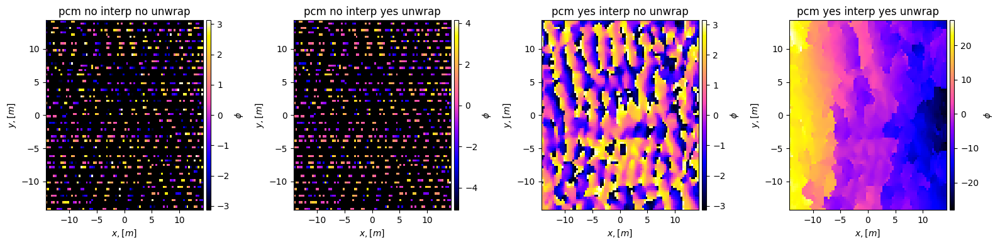

In [290]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=354
phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phiunwrap=unwrap2d(phi1,wrap_args=(False,True))
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))

im1=ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(-1.325,0.078,-0.019)
(D,E,F)=(-1.432,-0.011,3.373)
G=0.000


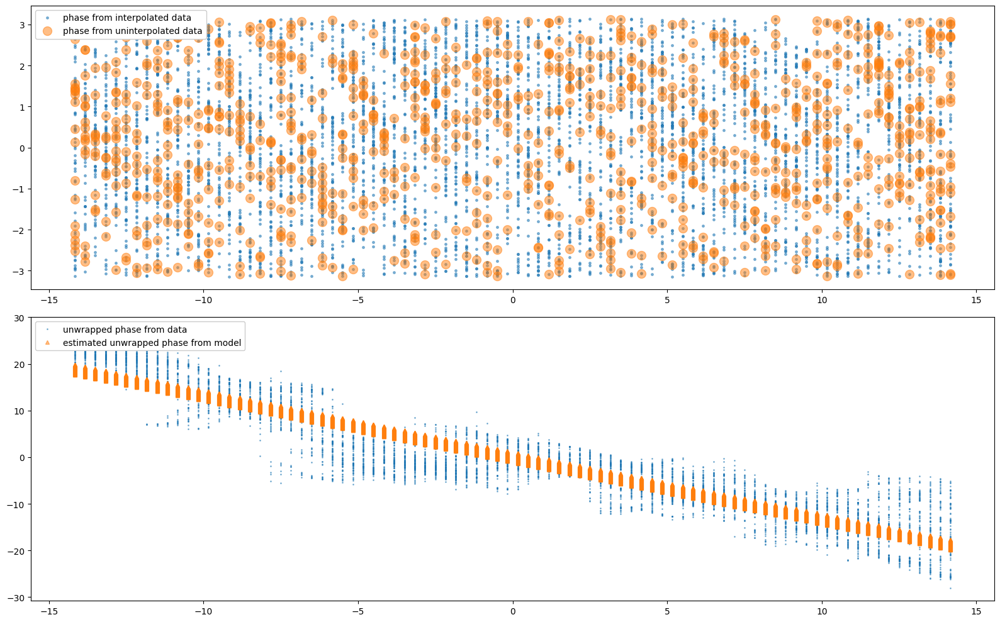

In [291]:
find=354
dx=testbeam.x_centers_grid[:,:,0]
dy=testbeam.y_centers_grid[:,:,1]
wl=(3.0e8/(testbeam.freq[find]/1e-6))
dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()

popt=least_squares(Fringe_Fit,x0=np.array([-1.4,0.0,+0.25,0.0,0.0,0.5,0]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(popt[0],popt[1],popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,10))
ax1.plot(dcoords[:,0],phi_i.flatten(),'.',alpha=0.5,markersize=5,label='phase from interpolated data')
ax1.plot(dcoords[:,0],phi1.flatten(),'.',alpha=0.5,markersize=20,label='phase from uninterpolated data')
ax1.legend(loc=2,framealpha=1)
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='unwrapped phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'^',alpha=0.5,markersize=5,label='estimated unwrapped phase from model')
ax2.legend(loc=2,framealpha=1)
tight_layout()

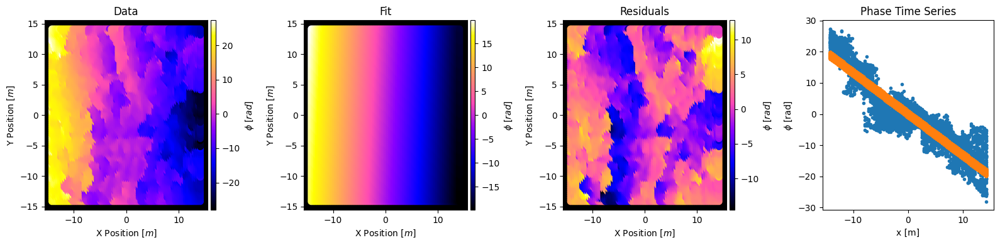

In [292]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,dcoords),cmap='gnuplot2')
#im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
#im1=ax2.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,dcoords)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [293]:
dx=testbeam.x_centers_grid[:,:,0]
dy=testbeam.y_centers_grid[:,:,1]
dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(97*np.ones((dx.shape[0]*dx.shape[1]))).flatten()

## I think this loop breaks when np.NaN occurs in the phi_i stage of the loop... going to check testbeam.beam_linear_interp_phase[:,:,find,0] for nan for each find...
fringepopt=np.NaN*np.ones((140,7))
fringedata=np.NaN*np.ones((testbeam.beam_linear_interp_phase.shape[0],testbeam.beam_linear_interp_phase.shape[1],140))
for k,find in enumerate(range(250,390)):
    print("{},{}".format(k,find),end='\r')
    wl=(3.0e8/(testbeam.freq[find]/1e-6))
    dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
    phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
    if True in np.isnan(testbeam.beam_linear_interp_phase[:,:,find,0]):
        print('true, breaking loop to skip index {}'.format(k))
    else:
        phi_iunwrap=unwrap2d(phi_i,wrap_args=(False,True))
        dcang=phi_iunwrap.flatten()
        fringedata[:,:,k]=phi_iunwrap
        popt=least_squares(Fringe_Fit,x0=np.array([-1.4,0.0,0.25,0.0,0.0,0.5,0]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
        fringepopt[k,:]=popt    

true, breaking loop to skip index 5
true, breaking loop to skip index 10
true, breaking loop to skip index 24
true, breaking loop to skip index 51
true, breaking loop to skip index 57
true, breaking loop to skip index 58
true, breaking loop to skip index 60
true, breaking loop to skip index 61
true, breaking loop to skip index 62
true, breaking loop to skip index 64
true, breaking loop to skip index 66
true, breaking loop to skip index 67
true, breaking loop to skip index 70
true, breaking loop to skip index 72
true, breaking loop to skip index 74
true, breaking loop to skip index 75
true, breaking loop to skip index 78
true, breaking loop to skip index 79
true, breaking loop to skip index 86
true, breaking loop to skip index 94
true, breaking loop to skip index 95
true, breaking loop to skip index 96
true, breaking loop to skip index 97
true, breaking loop to skip index 98
true, breaking loop to skip index 99
true, breaking loop to skip index 100
true, breaking loop to skip index 105


MovieWriter ffmpeg unavailable; using Pillow instead.


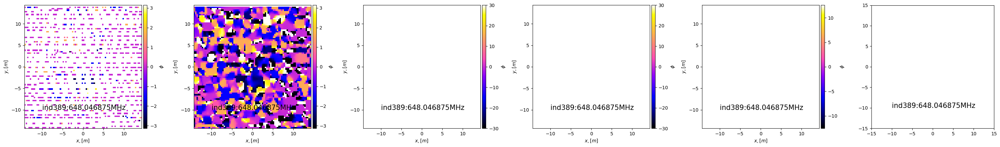

In [294]:
from matplotlib.animation import FuncAnimation
fig,[ax1,ax2,ax3,ax4,ax5,ax6]=subplots(nrows=1,ncols=6,figsize=(30,4.5))
cax1 = ax1.pcolormesh(dx, dy, np.angle(testbeam.V_LC_cross[:,:,250,0,0]), vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax2 = ax2.pcolormesh(dx, dy, testbeam.beam_linear_interp_phase[:,:,250,0], vmin=-1*np.pi, vmax=np.pi, cmap='gnuplot2')
cax3 = ax3.pcolormesh(dx, dy, fringedata[:,:,0], vmin=-30, vmax=30, cmap='gnuplot2')
cax4 = ax4.pcolormesh(dx, dy, Fringe(fringepopt[0,:],dcoords).reshape(dx.shape), vmin=-30, vmax=30, cmap='gnuplot2')
cax5 = ax5.pcolormesh(dx, dy, fringedata[:,:,0]-Fringe(fringepopt[0,:],dcoords).reshape(dx.shape), vmin=-4*np.pi, vmax=4*np.pi, cmap='gnuplot2')

images=[cax1,cax2,cax3,cax4,cax5]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]

for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5]):
    #ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
    
# fig.colorbar(cax1)
# fig.colorbar(cax2)
# fig.colorbar(cax3)
# fig.colorbar(cax4)
txt1=ax1.text(-10,-10, "", fontsize=15)
txt2=ax2.text(-10,-10, "", fontsize=15)
txt3=ax3.text(-10,-10, "", fontsize=15)
txt4=ax4.text(-10,-10, "", fontsize=15)
txt5=ax5.text(-10,-10, "", fontsize=15)
tight_layout()


def animate(vvv):
    cax1.set_array(np.angle(testbeam.V_LC_cross[:,:,250+vvv,0,0]))
    cax2.set_array(testbeam.beam_linear_interp_phase[:,:,250+vvv,0])
    cax3.set_array(fringedata[:,:,vvv])
    cax4.set_array(Fringe(fringepopt[vvv],dcoords).reshape(dx.shape))
    cax5.set_array(fringedata[:,:,vvv]-Fringe(fringepopt[vvv],dcoords).reshape(dx.shape))
    
    ax6.clear()
    ax6.plot(dcoords[:,0],fringedata[:,:,vvv].flatten(),'.')
    ax6.plot(dcoords[:,0],Fringe(np.array(fringepopt[vvv,:]),dcoords).flatten(),'.')
    ax6.set_xlim(-15,15)
    ax6.set_ylim(-15,15)
    txt6=ax6.text(-10,-10, "", fontsize=15)
    
    txt1.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt2.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt3.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt4.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt5.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    txt6.set_text("ind{}:{}MHz".format(testbeam.faxis[250:420][vvv],testbeam.freq[250:420][vvv]))
    print("{}".format(vvv),end='\r')

anim = FuncAnimation(fig, animate, interval=100, frames=140)
anim.save('../../Desktop/NFphaseEW.gif')
show()

/tmp/ipykernel_77883/2269895021.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
/tmp/ipykernel_77883/2269895021.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')


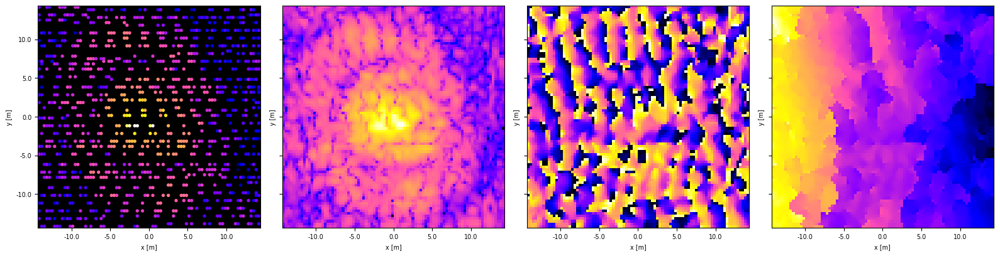

In [295]:
testbeam.beam_linear_interp_phase_unwrapped.shape

fig,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4),sharex=True,sharey=True)
ax1.set_facecolor('k')
find=354
ax1.scatter(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],c=np.abs(testbeam.V_LC_cross[:,:,find,0,0]),cmap='gnuplot2',s=8,norm=LogNorm())
#ax1.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.V_LC_mean[:,:,find,0,0]),cmap='gnuplot2',norm=LogNorm())
ax2.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],(testbeam.beam_linear_interp_amp[:,:,find,0]),cmap='gnuplot2',norm=LogNorm())
ax1.set_xlim(ax2.get_xlim())
ax1.set_ylim(ax2.get_ylim())
ax3.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0],cmap='gnuplot2')
ax4.pcolormesh(testbeam.x_edges_grid[:,:,0],testbeam.y_edges_grid[:,:,0],fringedata[:,:,find-250],cmap='gnuplot2')

for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    #ax.title(fontsize='x-small')
    ax.set_xlabel('x [m]',fontsize='x-small')
    ax.set_xticklabels(ax.get_xticks(),fontsize='x-small')
    #ax.set_xticks([])
    ax.set_ylabel('y [m]',fontsize='x-small')
    ax.set_yticklabels(ax.get_yticks(),fontsize='x-small')
    #ax.set_yticks([])
    ax.set(aspect='equal')


tight_layout()


0.4271412680756396

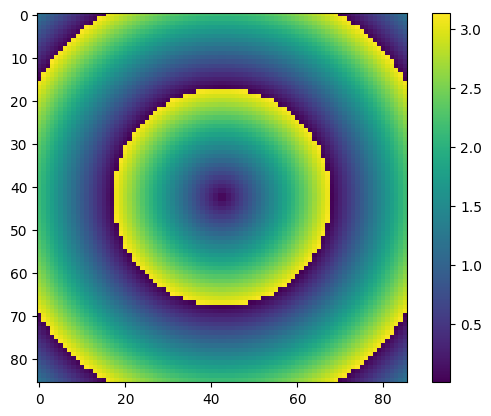

In [296]:
imshow((np.sqrt(dx**2.0+dy**2.0)/(2*np.pi*.427))%(np.pi))
colorbar()

3e8/(testbeam.freq[250]*1e6)

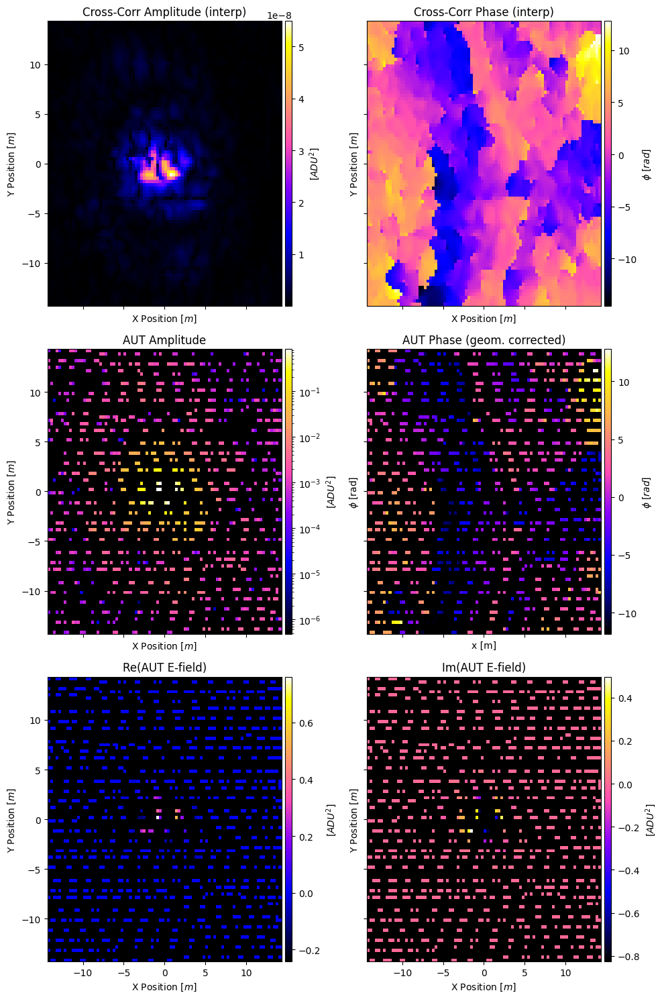

In [297]:
fig,[[ax1,ax2],[ax3,ax4],[ax5,ax6]]=subplots(nrows=3,ncols=2,figsize=(10,15),sharex=True,sharey=True)
zez=104
ampl=testbeam.V_LC_mean[:,:,250+zez,0,0]
nanmask=ampl/ampl
phase=fringedata[:,:,zez]-Fringe(fringepopt[zez],dcoords).reshape(dx.shape)
phasefactor=np.e**(1.0j*phase)
cplxEfieldEW=ampl*phasefactor

im1=ax1.pcolormesh(dx, dy, testbeam.beam_linear_interp_amp[:,:,250+zez,0], cmap='gnuplot2')
im2=ax2.pcolormesh(dx, dy, phase, cmap='gnuplot2')
im3=ax3.pcolormesh(dx, dy, ampl, norm=LogNorm(), cmap='gnuplot2')
im4=ax4.pcolormesh(dx, dy, nanmask*phase, cmap='gnuplot2')
im5=ax5.pcolormesh(dx, dy, np.real(cplxEfieldEW), cmap='gnuplot2')
im6=ax6.pcolormesh(dx, dy, np.imag(cplxEfieldEW), cmap='gnuplot2')

images=[im1,im2,im3,im4,im5,im6]
cbars=['[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','$\phi$ [$rad$]','[$ADU^2$]','[$ADU^2$]']
titles=["Cross-Corr Amplitude (interp)","Cross-Corr Phase (interp)","AUT Amplitude","AUT Phase (geom. corrected)","Re(AUT E-field)","Im(AUT E-field)"]
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()

In [298]:
stop
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
ax1.pcolormesh(dx,dy,np.abs(cplxEfieldEW))
ax2.pcolormesh(dx,dy,np.abs(cplxEfieldNS))

np.savez("/home/tyndall/Desktop/f354cplxEfield.npz",cplxEfieldEW=cplxEfieldEW,cplxEfieldNS=cplxEfieldNS)


NameError: name 'stop' is not defined

In [228]:
dat=np.load("/home/tyndall/Desktop/f354cplxEfield.npz")
for key in dat.keys():
    print(key)
dat['cplxEfieldEW']
dat['cplxEfieldNS']

cplxEfieldEW
cplxEfieldNS


(86, 86)

In [229]:
testbeam.freq[354]

661.71875

In [ ]:
STOP

start of big ass loop is: 2024-01-23 14:28:09.963673


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: divide by zero encountered in reciprocal
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:250: RuntimeWarning: invalid value encountered in multiply
  Vvals=(np.repeat(np.swapaxes(g_norm[:,self.fmin:self.fmax:self.fstep],0,1)[np.newaxis,:,:],len(ccc.inds_on),axis=0)**-1)*ccc.V_bgsub[ccc.inds_on,self.fmin:self.fmax:self.fstep,:]


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/scipy/stats/_binned_statistic.py:594: RuntimeWarning: invalid value encountered in subtract
  delta = values[vv] - flatsum[binnumbers] / flatcount[binnumbers]


end of chan/freq loop is: 2024-01-23 14:28:25.538382           


/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:329: RuntimeWarning: Mean of empty slice
  self.V_LC_operation=np.nanmean(self.V_LC_mean,axis=4)
/home/tyndall/python/beamcals_venv/lib/python3.10/site-packages/beamcals/beammap.py:342: RuntimeWarning: Mean of empty slice
  im4=ax4.pcolormesh(self.x_edges_grid[:,:,i],self.y_edges_grid[:,:,i],np.nanmean(self.V_LC_std[:,:,find,i,:],axis=2),cmap=cm.gnuplot2,norm=LogNorm())


/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/FLY781_20230519T190815Z_ver_20240123T142826beam_concat.pkl
DONE


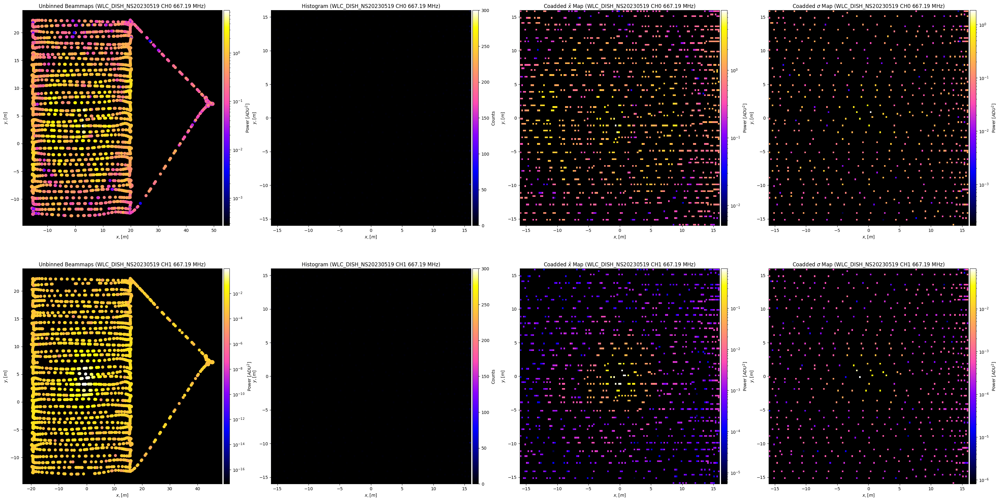

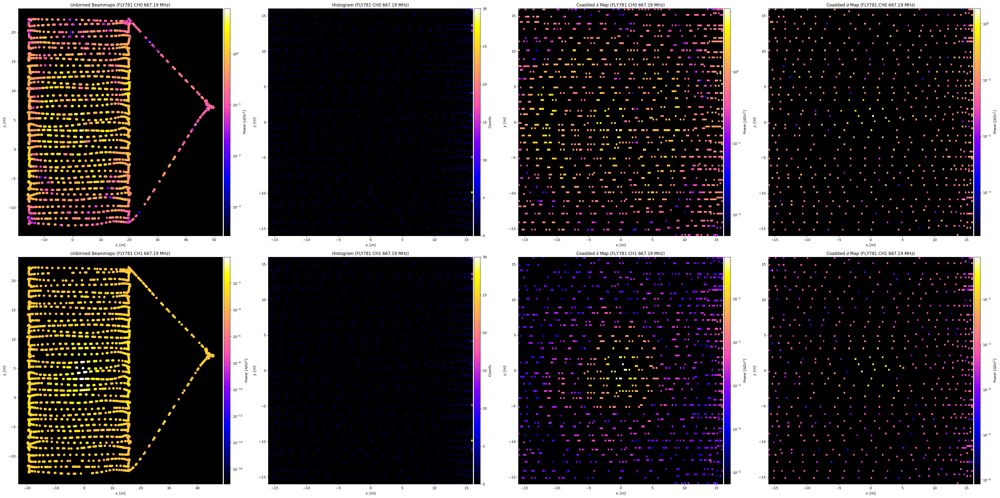

In [28]:
#NF
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-18,16,0.5],Yargs=[-17,18,0.5],f_index=340,normalization='Gauss',operation='coadd',
testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-16,16,0.25],Yargs=[-16,16,0.25],f_index=340,normalization='Gauss',operation='coadd',
#testbeam=beammap.Beammap(concatlist=[pcklarr[2]],gfitlist=[gfitarr[2]],Xargs=[-20,20,0.225],Yargs=[-20,20,0.225],f_index=340,normalization='Gauss',operation='coadd',
                         pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/pickles/",\
                         gfit_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/gfits/",\
                         flightmasterpath="/home/tyndall/python/beamcals_venv/newburghlabdrone/analysis/WLC_flights_forscripts.yaml",vplot=True,include_cross_data=True)

#export pickle for reduced class data for beammap function (include_cross_data=True will save V_cross_bgsub):
thingy = rc.Smallify_comap(beamclass=testbeam,pickle_directory="/home/tyndall/Desktop/20230519_WLC_NF2FF_Flights/products/beam_pickles/",include_cross_data=True)
print(thingy.tmppath)
with open(thingy.tmppath, 'wb') as outp:
    pickle.dump(thingy, outp, pickle.HIGHEST_PROTOCOL)
print('DONE')

In [89]:
testbeam.complex_interpolation(x_interp=testbeam.x_centers[:,0], y_interp=testbeam.y_centers[:,0],method='linear',variogram_model='spherical',outputs=False,Fargs=[340,340])

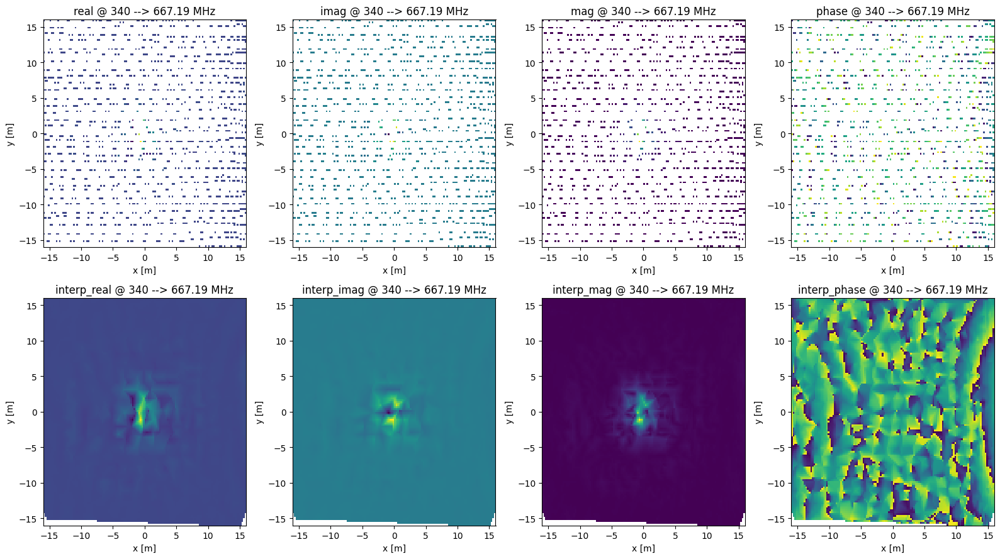

In [111]:
fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,9))
find=340
ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.real[:,:,find,0,0])
ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.V_LC_cross.imag[:,:,find,0,0])
ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.abs(testbeam.V_LC_cross)[:,:,find,0,0])#,norm=LogNorm())
ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.angle(testbeam.V_LC_cross)[:,:,find,0,0])

ax5.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.real[:,:,find,0])
ax6.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp.imag[:,:,find,0])
ax7.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])#,norm=LogNorm())
ax8.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_phase[:,:,find,0])

titles=['real','imag','mag','phase','interp_real','interp_imag','interp_mag','interp_phase']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[i]+' @ {} --> {:.2f} MHz'.format(find,testbeam.freq[find]))
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
tight_layout()

95

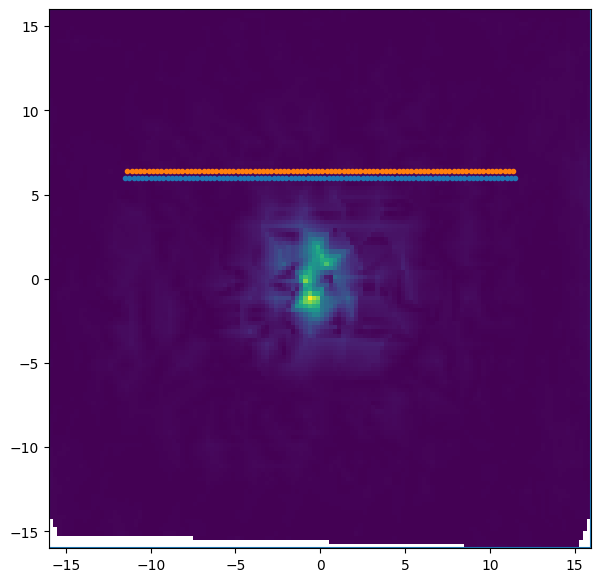

In [112]:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(7,7))
ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],testbeam.beam_linear_interp_amp[:,:,find,0])

testbeam.x_centers_grid.shape
177/2
ax1.axhline(16)
ax1.axhline(-16)
ax1.axvline(16)
ax1.axvline(-16)

plot(testbeam.x_edges_grid[18:-18,0,0],testbeam.y_edges_grid[18:-18,88,0],'.')
plot(testbeam.x_centers_grid[18:-18,0,0],testbeam.y_centers_grid[18:-18,89,0],'.')
len(testbeam.x_edges[17:-17])

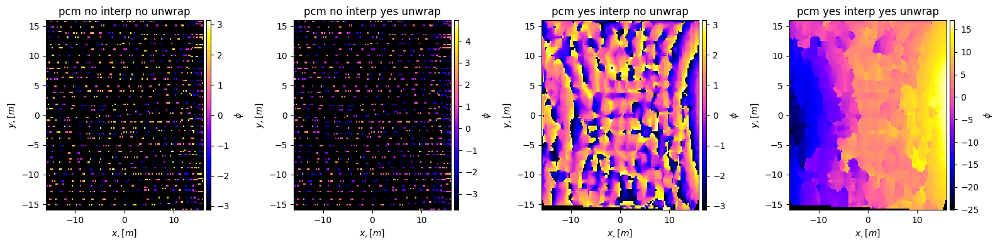

In [120]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
find=340
phi1=np.angle(testbeam.V_LC_cross[:,:,find,0,0])
phiunwrap=unwrap2d(phi1)
phi_i=testbeam.beam_linear_interp_phase[:,:,find,0]
phi_iunwrap=unwrap2d(phi_i)

im1=ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi1,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phiunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_i,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_iunwrap,cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["pcm no interp no unwrap","pcm no interp yes unwrap","pcm yes interp no unwrap","pcm yes interp yes unwrap"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
# for ax in [ax2,ax5,ax6]:
#     ax.plot(range(-20,20),range(-20,20),'r-',linewidth=10)
tight_layout()


(A,B,C)=(5.436,0.209,-0.829)
(D,E,F)=(11.854,-7.616,15.083)
G=0.200


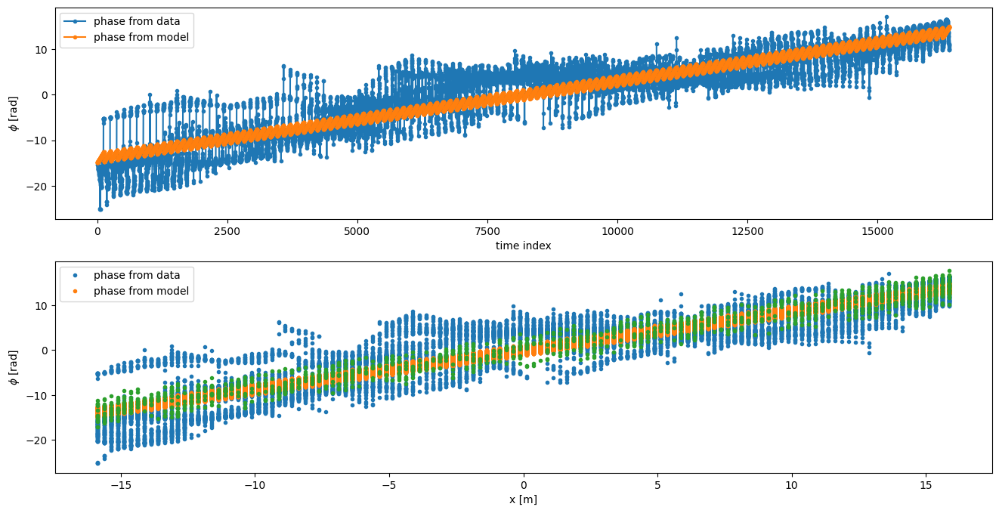

In [121]:
dx=testbeam.x_centers_grid[:,:,0]
dy=testbeam.y_centers_grid[:,:,1]
wl=(3.0e8/(testbeam.freq[find]/1e-6))
dc=(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcabs=np.abs(testbeam.V_LC_cross[:,:,find,0,0]).flatten()
dcang=phi_iunwrap.flatten()

dcoords=np.zeros((dx.shape[0]*dx.shape[1],3))
dcoords[:,0]=dx.flatten()
dcoords[:,1]=dy.flatten()
dcoords[:,2]=(18*np.ones((dx.shape[0]*dx.shape[1]))).flatten()

# dxax=np.linspace(-10,10,1000)
# dyax=np.linspace(-10,10,1000)
# griddx,griddy=np.meshgrid(dxax,dyax)
# sqware=np.outer(dxax,dyax)

popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,4.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt[0],2*np.pi*wl*popt[1],2*np.pi*wl*popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang,'.-',label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords),'.-',label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[:,0],dcang,'.',label='phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.',label='phase from model')
ax2.plot(testbeam.x_centers_grid[:,:,0].flatten(),(phi1+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape)).flatten(),'.')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()



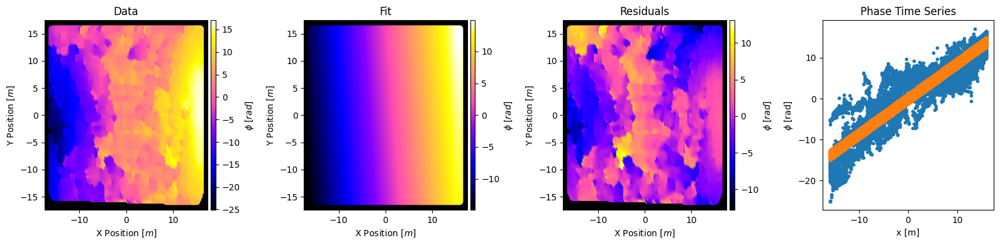

In [122]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,dcoords),cmap='gnuplot2')
#im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
#im1=ax2.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,dcoords)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


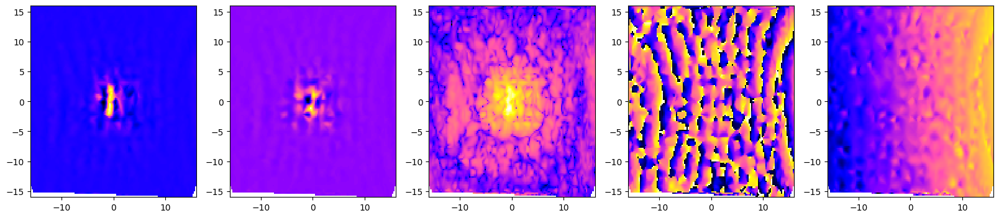

In [123]:
noNans = np.isfinite(testbeam.V_LC_cross[:,:,340,0,0]) # all x, y, chosen frequency and channel
x_noNan = testbeam.x_centers_grid[noNans,0]
y_noNan = testbeam.y_centers_grid[noNans,0]

x_interp=testbeam.x_centers[:,0]
y_interp=testbeam.y_centers[:,0]
x_interp_grid,y_interp_grid=np.meshgrid(x_interp,y_interp,indexing='ij')

fig,[ax1,ax2,ax3,ax4,ax5]=subplots(nrows=1,ncols=5,figsize=(20,4))
interp_re = griddata((x_noNan,y_noNan), np.real(testbeam.V_LC_cross[:,:,340,0,0][noNans]), (x_interp_grid,y_interp_grid), method='cubic')
interp_im = griddata((x_noNan,y_noNan), np.imag(testbeam.V_LC_cross[:,:,340,0,0][noNans]), (x_interp_grid,y_interp_grid), method='cubic')
interp_c = interp_re + 1.0j*interp_im
interp_phi = griddata((x_noNan,y_noNan),(np.angle(testbeam.V_LC_cross[:,:,340,0,0])+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape))[noNans], (x_interp_grid,y_interp_grid), method='cubic')

ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_re,cmap='gnuplot2')
ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_im,cmap='gnuplot2')
ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.abs(interp_c),cmap='gnuplot2',norm=LogNorm())
ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],np.angle(interp_c),cmap='gnuplot2')
ax5.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],interp_phi,cmap='gnuplot2')


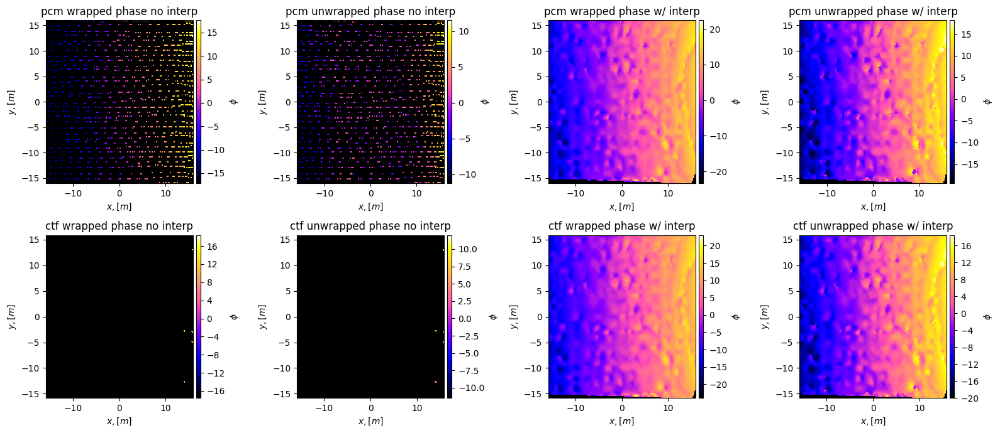

In [124]:
phi_re=(np.angle(testbeam.V_LC_cross[:,:,find,0,0])+Fringe(np.array(popt),dcoords).reshape(testbeam.V_LC_cross[:,:,find,0,0].shape))
phi_reunwrap=unwrap2d(phi_re)

phi_rei=interp_phi
phi_reiunwrap=unwrap2d(phi_rei)

fig,[[ax1,ax2,ax3,ax4],[ax5,ax6,ax7,ax8]]=subplots(nrows=2,ncols=4,figsize=(16,7))
im1=ax1.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_re,cmap='gnuplot2')
im2=ax2.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reunwrap,cmap='gnuplot2')
im3=ax3.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_rei,cmap='gnuplot2')
im4=ax4.pcolormesh(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reiunwrap,cmap='gnuplot2')
im5=ax5.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_re,50,cmap='gnuplot2')
im6=ax6.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reunwrap,50,cmap='gnuplot2')
im7=ax7.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_rei,50,cmap='gnuplot2')
im8=ax8.contourf(testbeam.x_centers_grid[:,:,0],testbeam.y_centers_grid[:,:,0],phi_reiunwrap,50,cmap='gnuplot2')
images=[im1,im2,im3,im4,im5,im6,im7,im8]
titles=["pcm wrapped phase no interp","pcm unwrapped phase no interp","pcm wrapped phase w/ interp","pcm unwrapped phase w/ interp",\
        "ctf wrapped phase no interp","ctf unwrapped phase no interp","ctf wrapped phase w/ interp","ctf unwrapped phase w/ interp"]
cbarlabels=["$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$","$\phi$"]
for j,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    ax.set_title(titles[j])
    ax.set_facecolor('k')
    ax.set_xlabel('$x,[m]$')
    ax.set_ylabel('$y, [m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig.colorbar(images[j],cax=cax)
    cbar.set_label(cbarlabels[j])
tight_layout()

(A,B,C)=(5.436,0.209,-0.829)
(D,E,F)=(11.854,-7.616,15.083)
G=0.200
(A,B,C)=(5.381,0.213,-0.562)
(D,E,F)=(6.265,1.227,8.358)
G=0.200


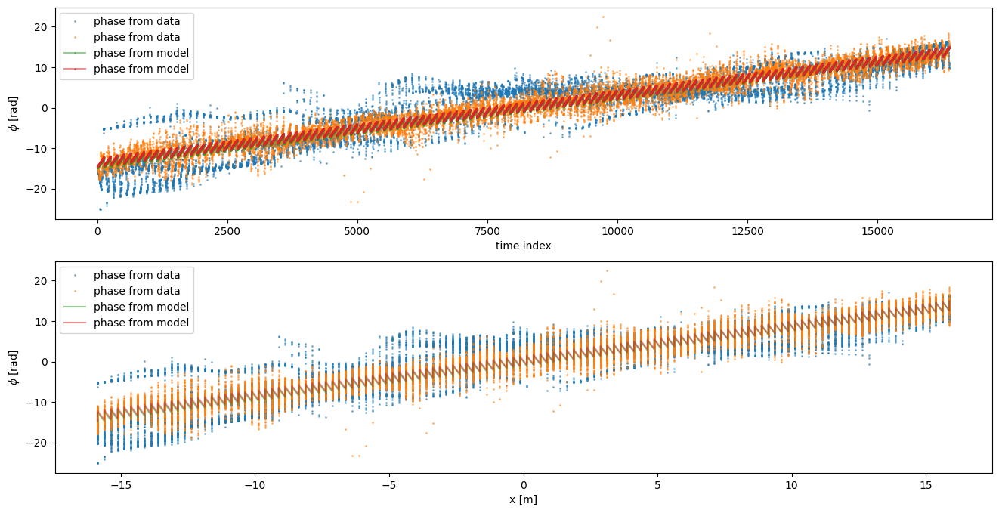

In [125]:
popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,4.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(dcang)],dcang[~np.isnan(dcang)]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt[0],2*np.pi*wl*popt[1],2*np.pi*wl*popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

popt2=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,0.0,0.0,0.5,0.2]),args=[dcoords[~np.isnan(interp_phi.flatten())],interp_phi[~np.isnan(interp_phi)].flatten()]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(2*np.pi*popt2[0],2*np.pi*wl*popt2[1],2*np.pi*wl*popt2[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt2[3],popt2[4],popt2[5]))
print("G={:.3f}".format(popt2[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang,'.',alpha=0.5,markersize=2,label='phase from data')
ax1.plot(interp_phi.flatten(),'.',alpha=0.5,markersize=2,label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords),'.-',alpha=0.5,markersize=2,label='phase from model')
ax1.plot(Fringe(np.array(popt2),dcoords),'.-',alpha=0.5,markersize=2,label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[:,0],dcang,'.',alpha=0.5,markersize=2,label='phase from data')
ax2.plot(dcoords[:,0],interp_phi.flatten(),'.',alpha=0.5,markersize=2,label='phase from data')
ax2.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'-',alpha=0.5,markersize=2,label='phase from model')
ax2.plot(dcoords[:,0],Fringe(np.array(popt2),dcoords),'-',alpha=0.5,markersize=2,label='phase from model')

#ax2.plot(testbeam.x_centers_grid[:,:,0].flatten(),(phi1+Fringe(np.array(popt),dcoords).reshape(128,128)).flatten(),'.')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()

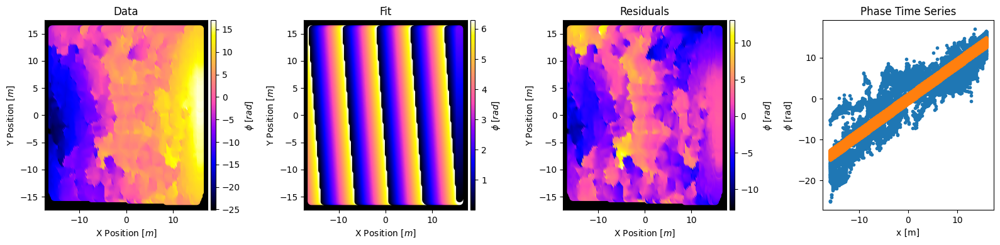

In [126]:
fig1,[ax1,ax2,ax3,ax4]=subplots(nrows=1,ncols=4,figsize=(16,4))
im1=ax1.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im2=ax2.scatter(dx,dy,s=50,c=Fringe(popt,dcoords)%(2*np.pi),cmap='gnuplot2')
#im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
#im1=ax2.scatter(dx,dy,s=50,c=dcang,cmap='gnuplot2')
im3=ax3.scatter(dx,dy,s=50,c=(dcang-Fringe(popt,dcoords)),cmap='gnuplot2')
ax4.plot(dcoords[:,0],dcang,'.')
ax4.plot(dcoords[:,0],Fringe(np.array(popt),dcoords),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()

In [58]:
def Fringe_Spacing(freq,find,h,b,x=0):
    
    f = freq
    wavelength=3e8/(f*1e6)
    print('lambda at f_ind 345: {}'.format(wavelength))
    
    if x==0:
        theta=np.pi/2
    else:
        theta = np.arctan(h/np.abs(x))
        
    print(np.sin(theta))
    dtheta=wavelength/(b*np.sin(theta))
    print('delta theta at find={} in radians: {}'.format(find,dtheta))
    x_dist = h*np.tan(dtheta)
    print('Delta_x: {}'.format(x_dist))
    
    return x_dist

In [61]:
Fringe_Spacing(testbeam.freq[340],340,20,13.5,x=testbeam.x_centers[50,0])

lambda at f_ind 345: 0.4496487119437939
0.5605146115728086
delta theta at find=340 in radians: 0.0594227363714498
Delta_x: 1.1898555416230296


1.1898555416230296

In [60]:
np.arctan(20/np.abs(testbeam.x_centers[50,0]))

0.5950070725094485